In [39]:
from folium.plugins import MarkerCluster
from folium import plugins
import folium

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import json

In [2]:
# 전처리한 새로운 csv 파일 불러오기
preprocessed_df_tailgate = pd.read_csv('preprocessed_csv/df_tailgate.csv')
preprocessed_df_illegal_u_turn = pd.read_csv('preprocessed_csv/df_illegal_u_turn.csv')
preprocessed_df_illegal_left_turn = pd.read_csv('preprocessed_csv/df_illegal_left_turn.csv')
preprocessed_df_signal_violation = pd.read_csv('preprocessed_csv/df_signal_violation.csv')
preprocessed_df_wrong_way_driving = pd.read_csv('preprocessed_csv/df_wrong_way_driving.csv')
preprocessed_df_stop_line_violation = pd.read_csv('preprocessed_csv/df_stop_line_violation.csv')
preprocessed_df_center_line_violation = pd.read_csv('preprocessed_csv/df_center_line_violation.csv')
preprocessed_df_designated_lane_violation = pd.read_csv('preprocessed_csv/df_designated_lane_violation.csv')
preprocessed_df_improper_lane_change = pd.read_csv('preprocessed_csv/df_improper_lane_change.csv')

# 모든 데이터 프레임 일괄 저장용 리스트: (이름, 데이터프레임)
preprocessed_all_name_N_df = [
    ('꼬리물기', preprocessed_df_tailgate),
    ('불법 유턴', preprocessed_df_illegal_u_turn),
    ('불법 좌회전', preprocessed_df_illegal_left_turn),
    ('신호 위반', preprocessed_df_signal_violation),
    ('역주행', preprocessed_df_wrong_way_driving),
    ('정지선 침범', preprocessed_df_stop_line_violation),
    ('중앙선 침범', preprocessed_df_center_line_violation),
    ('지정 차로 위반', preprocessed_df_designated_lane_violation),
    ('진로 변경 위반', preprocessed_df_improper_lane_change)
]

In [13]:
check_data = [
    [preprocessed_df_improper_lane_change, "진로 변경 위반", "화성시"],
    [preprocessed_df_signal_violation, "신호 위반", "화성시"],
    [preprocessed_df_improper_lane_change, "진로 변경 위반", "용인시수지구"],
    [preprocessed_df_improper_lane_change, "진로 변경 위반", "안동시"],
    [preprocessed_df_signal_violation, "신호 위반", "평택시"],
    [preprocessed_df_illegal_left_turn, "불법 좌회전", "화성시"],
    [preprocessed_df_illegal_left_turn, "불법 좌회전", "파주시"],
    [preprocessed_df_signal_violation, "신호 위반", "시흥시"],
    [preprocessed_df_illegal_left_turn, "불법 좌회전", "용인시수지구"],
    [preprocessed_df_wrong_way_driving, "역주행", "대전광역시 서구"],   
]

In [5]:
# JSON 파일 불러오기
json_file = 'PRE_TL_SCCO_SIG.json'

# UTF-8 인코딩으로 JSON 로딩하기
korea_geo = json.load(open(json_file, encoding='UTF-8'))

In [22]:
# folium.Map(location= [위도, 경도], zoom_start= 지도_배율)
# 1배율: 세계_지도, 5배율: 대한민국_지도
draw_map = folium.Map(
    [37.54811169065214, 126.942004340589],
    zoom_start= 20,
    tiles='cartodbpositron',
)

# JSON으로 나눈 구역을 folium으로 그리기
folium.GeoJson(
    korea_geo,
    name = '시군구',
).add_to(draw_map)

In [30]:
mc1 = MarkerCluster()
mc2 = MarkerCluster()
mc3 = MarkerCluster()
mc4 = MarkerCluster()
mc5 = MarkerCluster()
mc6 = MarkerCluster()
mc7 = MarkerCluster()
mc8 = MarkerCluster()
mc9 = MarkerCluster()
mc10 = MarkerCluster()

In [32]:
draw_map

In [31]:
for mc_num, (df, df_name, find_region) in enumerate(check_data, 1):
    for i, each_row in enumerate(df.iloc):
        line_number = each_row[0]
        latitude = each_row[2]
        longitude = each_row[3]
        region = each_row[4]
    
        # Polygon에서 특정 지역만을 탐색
        if region == find_region:
            exec(f'folium.Marker(location = [latitude, longitude], popup = df_name + find_region).add_to(mc{mc_num})')
            
    exec(f'mc{mc_num}.add_to(draw_map)')


# for i, each_row in enumerate(preprocessed_df_wrong_way_driving.iloc):
#     line_number = each_row[0]
#     latitude = each_row[2]
#     longitude = each_row[3]
#     region = each_row[4]

#     # Polygon에서 특정 지역만을 탐색
#     if region == "대전광역시 서구":
#         folium.Marker(location = [latitude, longitude],popup = df_name + find_region).add_to(mc1)
#         #exec(f'folium.Marker(location = [latitude, longitude],popup = df_name + find_region).add_to(mc{mc_num})')
        
# mc1.add_to(draw_map)

Text(0.5, 1.0, '표지판 설치 현황')

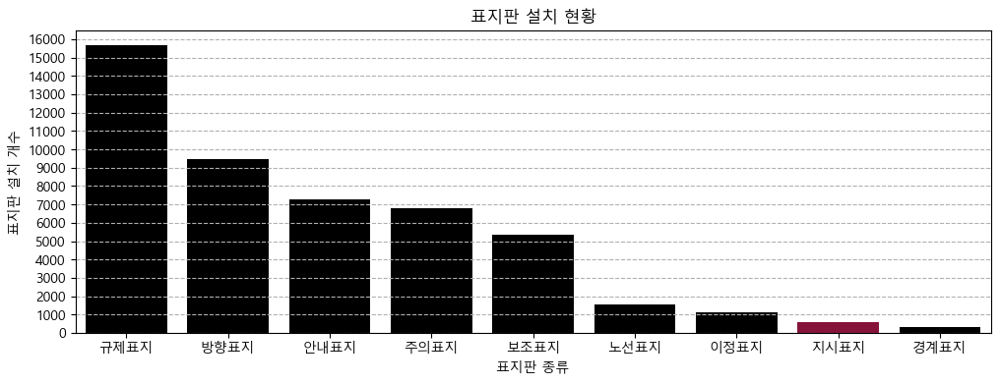

In [62]:
kinds = ['방향표지', '노선표지', '이정표지', '경계표지', '안내표지', '주의표지', '규제표지', '지시표지', '보조표지']
count = [9448, 1541, 1124, 316, 7259, 6790, 15701, 568, 5355]
df_sign = pd.DataFrame({"표지판 종류": kinds, "표지판 설치 개수": count})

df_sign = df_sign.sort_values(
    by = ['표지판 설치 개수'],
    ascending = [False]
)

plt.figure(figsize = (12, 4))
plt.rc('font', family='Malgun Gothic')
colors = ["#000000", "#000000", "#000000", "#000000", "#000000", "#000000", "#000000", "#990033", "#000000"]
sns.barplot(x = "표지판 종류", y = "표지판 설치 개수", data = df_sign, palette = colors)
plt.grid(axis = 'y', linestyle = '--')
plt.yticks(np.arange(0, 16001, 1000))
plt.title("표지판 설치 현황")